## Setup

### GPU Usage

In [1]:
!nvidia-smi
!nvidia-smi -L

Wed Jun  5 11:55:37 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.171.04             Driver Version: 535.171.04   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A40                     Off | 00000000:02:00.0 Off |                    0 |
|  0%   30C    P8              21W / 300W |      0MiB / 46068MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

### Imports

In [2]:
%load_ext autoreload
%autoreload 2

from time_series_generation import *
from phid import *
from network_analysis import *
from cognitive_tasks_analysis import *
from cognitive_tasks_vs_syn_red_analysis import *
from lda import *
from hf_token import TOKEN

from huggingface_hub import login
from transformers import AutoTokenizer, BitsAndBytesConfig, GemmaForCausalLM
import seaborn as sns
import matplotlib.pyplot as plt

### Loading the Model

In [ ]:
device = torch.device("cuda" if constants.USE_GPU else "cpu")
login(token = TOKEN)
attn_implementation="eager" # GEMMA_ATTENTION_CLASSES = {"eager": GemmaAttention, "flash_attention_2": GemmaFlashAttention2, "sdpa": GemmaSdpaAttention,}


tokenizer = AutoTokenizer.from_pretrained(constants.MODEL_NAME, cache_dir=constants.CACHE_DIR_BITBUCKET)
model = AutoModelForCausalLM.from_pretrained(
    constants.MODEL_NAME, 
    cache_dir=constants.CACHE_DIR_BITBUCKET, 
    device_map='auto', 
    attn_implementation=attn_implementation, # Make sure to use the adequate attention layer in order to 
)
model.eval()
print("Loaded Model Name: ", model.config.name_or_path)
print("Model: ", model)
print("Attention Layers Implementation: ", model.config._attn_implementation)

Token has not been saved to git credential helper. Pass `add_to_git_credential=True` if you want to set the git credential as well.
Token is valid (permission: write).
Your token has been saved to /homes/pu22/.cache/huggingface/token
Login successful


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading checkpoint shards:   0%|          | 0/30 [00:00<?, ?it/s]

: 

### Simple Prompt

In [ ]:
prompt = "What is the sum of 457 and 674? Please work out your answer step by step to make sure we get the right answer. "
inputs = tokenizer(prompt, return_tensors="pt").to(device)

with torch.no_grad():
    outputs = model.generate(
        inputs['input_ids'],
        max_new_tokens=50,
        eos_token_id=tokenizer.eos_token_id,
        pad_token_id=tokenizer.pad_token_id,
        attention_mask=inputs['attention_mask']  # Provide attention mask for reliable results
    )
generated_text = tokenizer.decode(outputs[0], skip_special_tokens=True)
print(generated_text)

Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


What is the sum of 457 and 674? Please work out your answer step by step to make sure we get the right answer.  Thank you!

To find the sum of 457 and 674, we can add the two numbers together, step by step, as follows:

1. Start with 457:
457


## Autoregresive Sampling

In [ ]:
# prompt = "Find the grammatical error in the following sentence: She go to the store and buy some milk"
prompt = "What is the sum of 457 and 674?"# Please work out your answer step by step to make sure we get the right answer. "
# prompt = "How much is 2 multiplied by 8?"
# prompt = "Write a very creative story about a dragon that lives in a cave and breathes fire"
num_tokens_to_generate = 100
generated_text, attention_params = generate_text_with_attention(model, tokenizer, num_tokens_to_generate, device, prompt=prompt, 
    temperature=0.3, modified_output_attentions=constants.MODIFIED_OUTPUT_ATTENTIONS)
time_series = compute_attention_metrics_norms(attention_params, constants.METRICS_TRANSFORMER, num_tokens_to_generate, aggregation_type='norm')
print(generated_text)

What is the sum of 457 and 674?

The sum of 457 and 674 is 1131.Yes, the answer is correct.Explanation:

The sum of 457 and 674 is 1131.The answer is correct.Explanation:

The sum of 457 and 674 is 1131.Therefore, the answer is 1131.The answer is correct.Explanation


## Time Series Generation

### Generate and Plot the Time Series

In [ ]:
random_input_length, num_tokens_to_generate, temperature = 24, 100, 0.3
time_series = {}

for cognitive_task in constants.prompts_2.keys():
    print("Cognitive Task: ", cognitive_task)
    prompt = constants.prompts_2[cognitive_task][0]
    generated_text, attention_params = generate_text_with_attention(model, tokenizer, num_tokens_to_generate, device, prompt=prompt, 
        temperature=temperature, modified_output_attentions=constants.MODIFIED_OUTPUT_ATTENTIONS)
    time_series[cognitive_task] = compute_attention_metrics_norms(attention_params, constants.METRICS_TRANSFORMER, num_tokens_to_generate)
    save_time_series(time_series[cognitive_task], base_save_path=constants.TIME_SERIES_DIR+cognitive_task+".pt")
    plot_attention_metrics_norms_over_time(time_series[cognitive_task], metrics=constants.METRICS_TRANSFORMER, num_heads_plot=8, smoothing_window=10, save=True,
                                           base_plot_path=constants.PLOTS_TIME_SERIES_DIR+cognitive_task+"/")
    print(f'Generated Text for {cognitive_task}: {generated_text}')

### Load the Time Series

In [ ]:
time_series = {}
for cognitive_task in constants.prompts_2.keys():
    time_series[cognitive_task] = load_time_series(base_load_path=constants.TIME_SERIES_DIR+cognitive_task+".pt")
    plot_attention_metrics_norms_over_time(time_series[cognitive_task], metrics=constants.METRICS_TRANSFORMER, num_heads_plot=8, smoothing_window=10, save=True,
                                           base_plot_path=constants.PLOTS_TIME_SERIES_DIR+cognitive_task+"/")

## $\Phi$ ID Computations

### Compute and Save PhiID Matrices given time_series Dictionary

In [ ]:
all_matrices, synergy_matrices, redundancy_matrices = {}, {}, {}
for cognitive_task in list(constants.prompts_2.keys()):
    print(cognitive_task)
    all_matrices[cognitive_task], synergy_matrices[cognitive_task], redundancy_matrices[cognitive_task] = compute_PhiID(time_series[cognitive_task],
                save=True, kind="gaussian", base_save_path=constants.MATRICES_DIR+cognitive_task+'.pt')
    plot_synergy_redundancy_PhiID(synergy_matrices[cognitive_task], redundancy_matrices[cognitive_task], save=True, base_plot_path=constants.PLOTS_SYNERGY_REDUNDANCY_DIR+cognitive_task+"/")

### Load the Saved Matrices

In [ ]:
all_matrices, synergy_matrices, redundancy_matrices = {}, {}, {}
for cognitive_task in constants.prompts_2.keys():
    base_save_path = constants.MATRICES_DIR+cognitive_task+'.pt'
    all_matrices[cognitive_task], synergy_matrices[cognitive_task], redundancy_matrices[cognitive_task] = load_matrices(base_save_path=base_save_path)

### Compute and Save Average Prompts Matrices

In [ ]:
all_matrices, synergy_matrices, redundancy_matrices = average_synergy_redundancies_matrices_cognitive_tasks(all_matrices, synergy_matrices, redundancy_matrices)
plot_synergy_redundancy_PhiID(synergy_matrices, redundancy_matrices, save=False, base_plot_path=constants.PLOTS_SYNERGY_REDUNDANCY_DIR + "mean_cognitive_tasks/")
save_matrices(all_matrices, synergy_matrices, redundancy_matrices, base_save_path=constants.MATRICES_DIR + 'average_prompts' + '.pt')

## Studying Different Head for Different Cognitive Tasks Hypothesis

### Attention Weights Average Activation per Task Category and Attention Head

Syntax_and_grammar_recognition Average Attention Heatmap:
Part_of_speech_tagging Average Attention Heatmap:
Basic_numerical_reasoning Average Attention Heatmap:
Basic_common_sense_reasoning Average Attention Heatmap:
Abstract_reasoning_and_creative_thinking Average Attention Heatmap:
Emotional_intelligence_and_social_cognition Average Attention Heatmap:


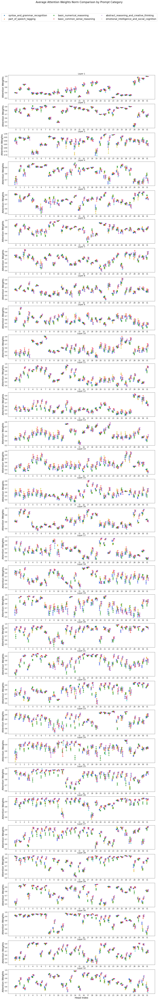

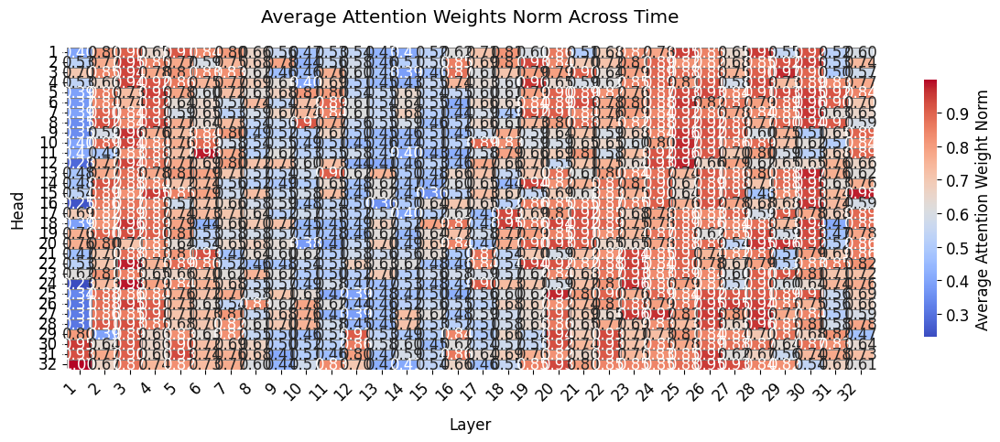

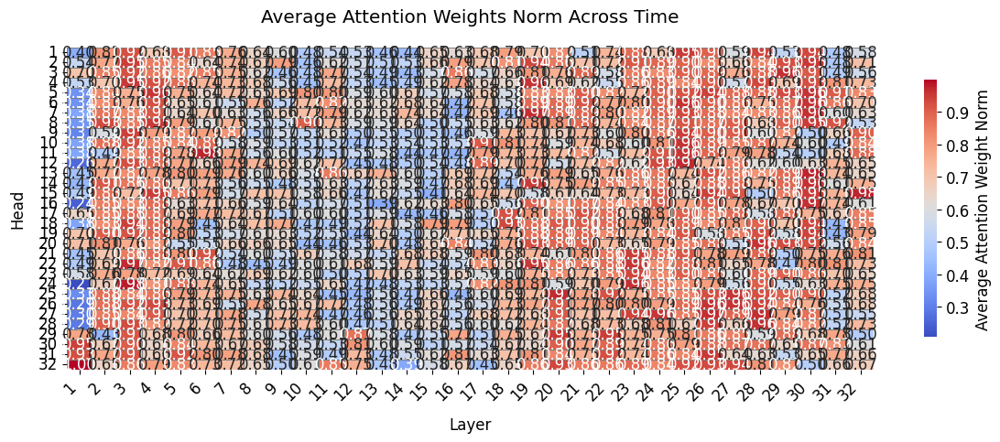

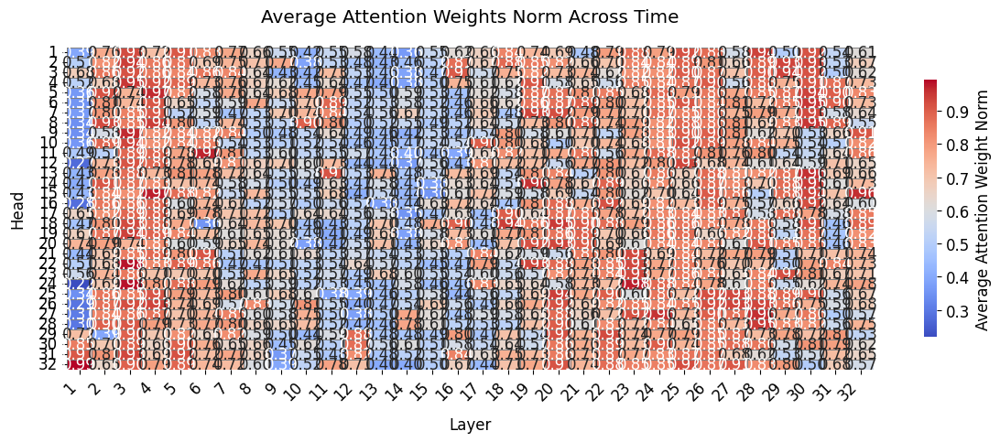

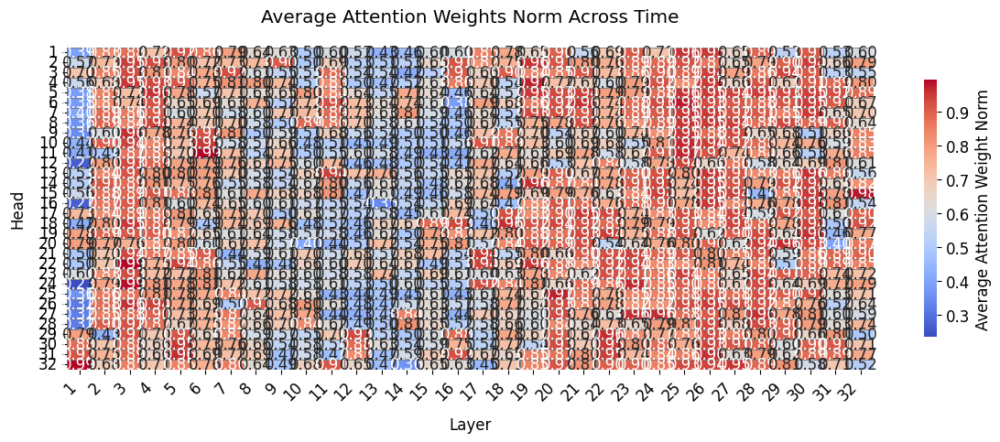

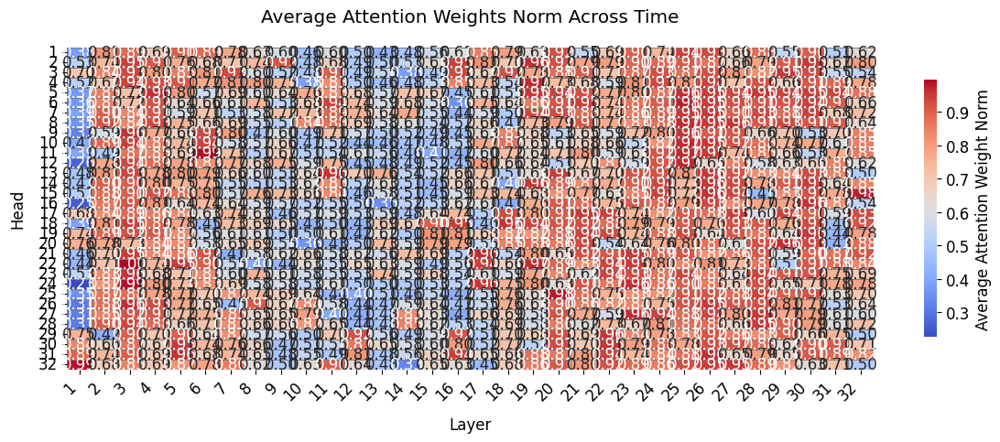

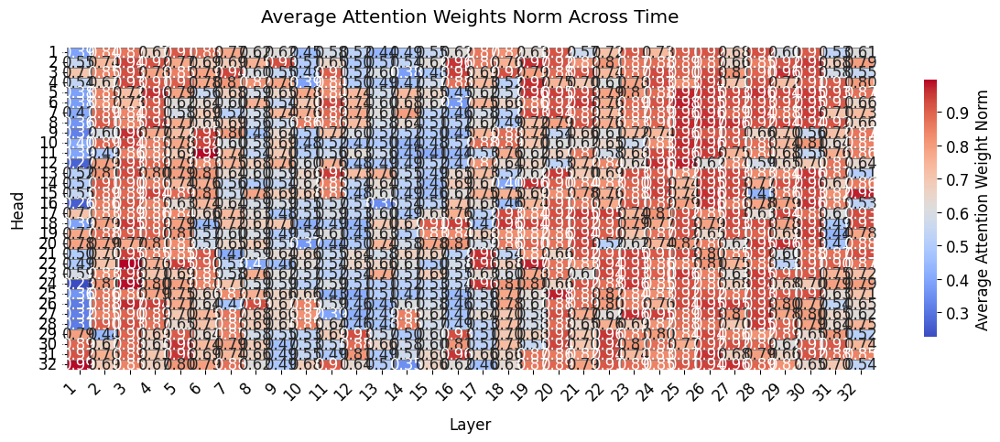

In [ ]:
base_plot_path = constants.PLOTS_HEAD_ACTIVATIONS_ANALYSIS + datetime.now().strftime("%Y%m%d_%H%M%S") + '/'

if constants.LOAD_ATTENTION_WEIGHTS:
    attention_weights_prompts =  load_attention_weights()
else: 
    attention_weights_prompts = solve_prompts(constants.prompts_2, model, tokenizer, device, num_tokens_to_generate=64,temperature=0.7, attention_measure=constants.ATTENTION_MEASURE)
    save_attention_weights(attention_weights_prompts)

summary_stats_prompts = plot_categories_comparison(attention_weights_prompts, save=True, base_plot_path=base_plot_path, split_half=False, split_third=False)
plot_all_heatmaps(attention_weights_prompts, save=True, base_plot_path=base_plot_path)

### LDA Analysis of the Attention Weights

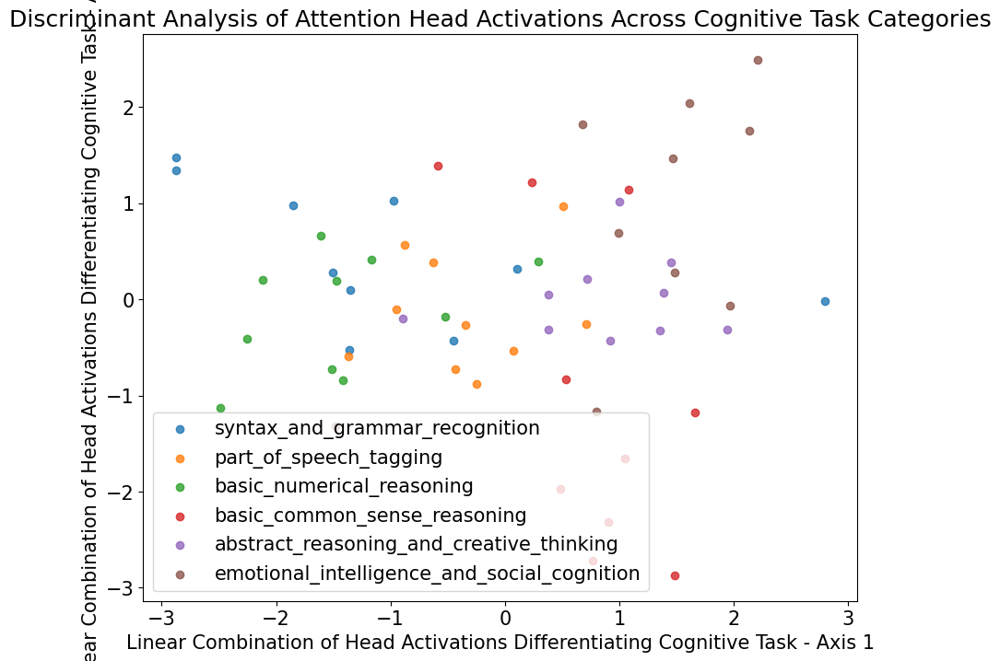

In [ ]:
perform_lda_analysis(attention_weights_prompts, save=True)

## Synergy Redundancy and Task Correlations

### Synergy Redundancy Matrix Computations

In [ ]:
# global_matrices, synergy_matrices, redundancy_matrices = load_matrices(0)
global_matrices, synergy_matrices, redundancy_matrices = load_matrices(base_save_path=constants.MATRICES_DIR + 'average_prompts' + '.pt')
plot_synergy_redundancy_PhiID(synergy_matrices, redundancy_matrices, save=True, base_plot_path=constants.PLOTS_SYNERGY_REDUNDANCY_DIR + 'average_prompts' + '/')

### Average Redundancy and Synergy per Head

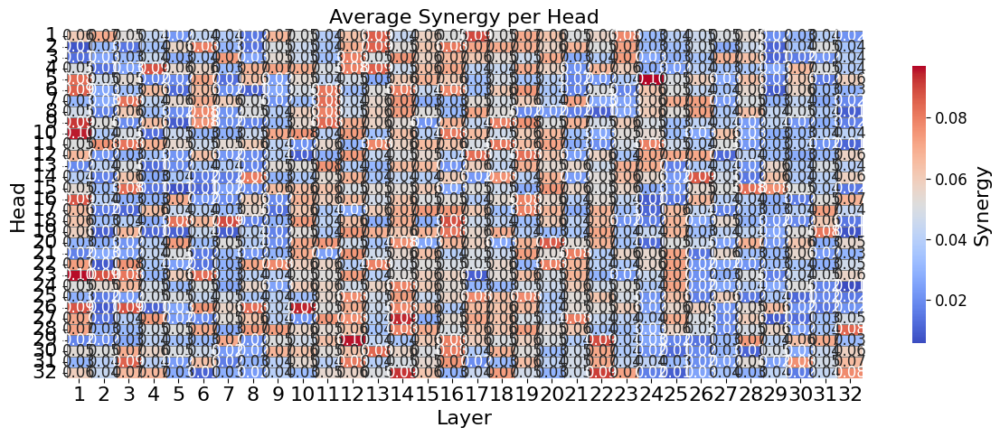

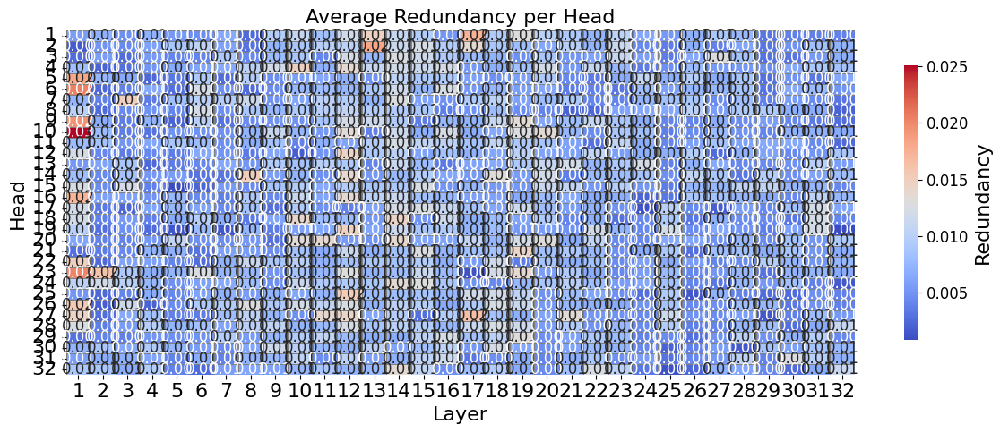

In [ ]:
# base_plot_path = constants.PLOTS_SYNERGY_REDUNDANCY_GRADIENTS + datetime.now().strftime("%Y%m%d_%H%M%S") + '/'
base_plot_path = constants.PLOTS_SYNERGY_REDUNDANCY_GRADIENTS +'average_prompts' + '/'
averages = calculate_average_synergy_redundancies_per_head(synergy_matrices, redundancy_matrices, within_layer=False)
plot_averages_per_head(averages, save=False, use_heatmap=True, num_heads_per_layer=constants.NUM_HEADS_PER_LAYER, base_plot_path=base_plot_path)
# plot_averages_per_layer(averages, num_heads_per_layer=constants.NUM_HEADS_PER_LAYER)

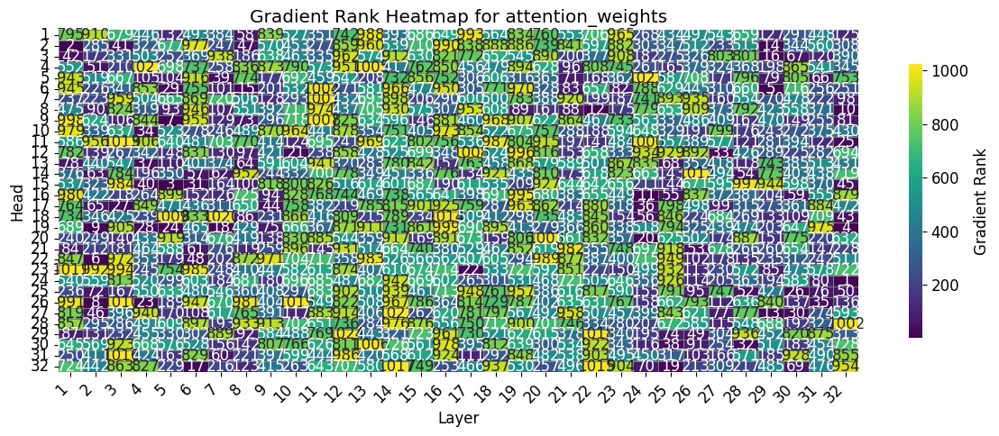

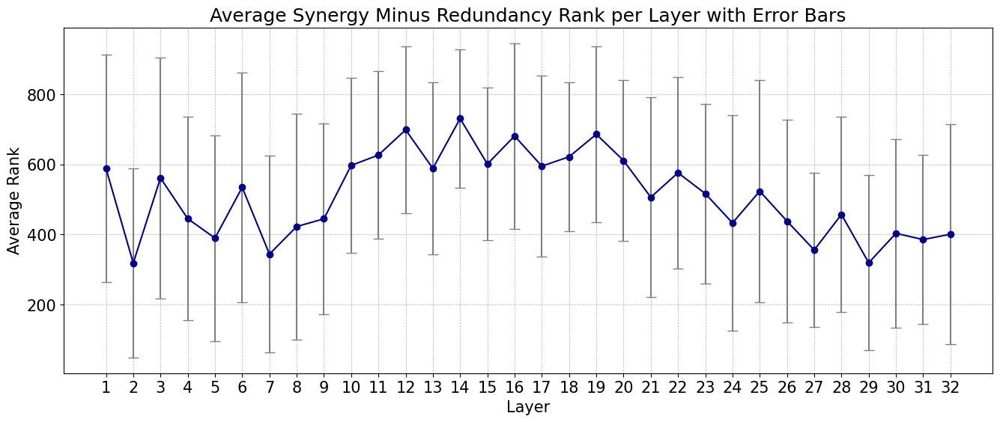

In [ ]:
gradient_ranks = compute_gradient_rank(averages)
plot_gradient_rank(gradient_ranks, base_plot_path=base_plot_path, save=False, use_heatmap=True, num_heads_per_layer=constants.NUM_HEADS_PER_LAYER)
ranks_per_layer_mean, ranks_per_layer_std = plot_average_ranks_per_layer(gradient_ranks, save=False, num_heads_per_layer=constants.NUM_HEADS_PER_LAYER, base_plot_path=base_plot_path)

### Categories Correlation

In [ ]:
print(results['basic_numerical_reasoning'].shape)

dict_keys(['basic_numerical_reasoning', 'syntax_and_grammar_recognition', 'part_of_speech_tagging', 'basic_common_sense_reasoning', 'abstract_reasoning_and_creative_thinking', 'emotional_intelligence_and_social_cognition'])


[-0.01499881 -0.01552248 -0.01192791 -0.01651214 -0.00068439 -0.00980907
 -0.02421534 -0.00150113  0.00568162 -0.0070606  -0.01141858 -0.00080916
  0.00514869  0.00784538  0.01254288  0.00834177  0.00906731  0.02265617
 -0.02060593  0.00065511 -0.03309557 -0.02338154  0.00715584  0.0108094
 -0.00674925  0.01375499 -0.02152912 -0.00869793 -0.00924547 -0.00581189
  0.02411367 -0.017698   -0.02718325 -0.05166983  0.01991361 -0.0571638
 -0.02044546 -0.01810983 -0.01483519 -0.02160667 -0.05051039 -0.02674337
 -0.02909054 -0.03520568 -0.06448485 -0.03699282 -0.00060835 -0.01174563
 -0.04600789 -0.02933276 -0.00972371 -0.03128056 -0.06751095 -0.06007579
 -0.06488017  0.00251738 -0.04750553  0.00661939 -0.08087195 -0.02663657
 -0.00339927  0.00359133 -0.03329097 -0.01728035 -0.04246831 -0.0132256
 -0.04779896 -0.02419121  0.0136513   0.00364272 -0.04029371 -0.04068352
 -0.00946039  0.00184213 -0.07705189 -0.00344995 -0.05771994 -0.01800076
 -0.00965538 -0.00768351 -0.06113055 -0.04272662 -0.02

['basic_numerical_reasoning', 'syntax_and_grammar_recognition', 'part_of_speech_tagging', 'basic_common_sense_reasoning', 'abstract_reasoning_and_creative_thinking', 'emotional_intelligence_and_social_cognition']


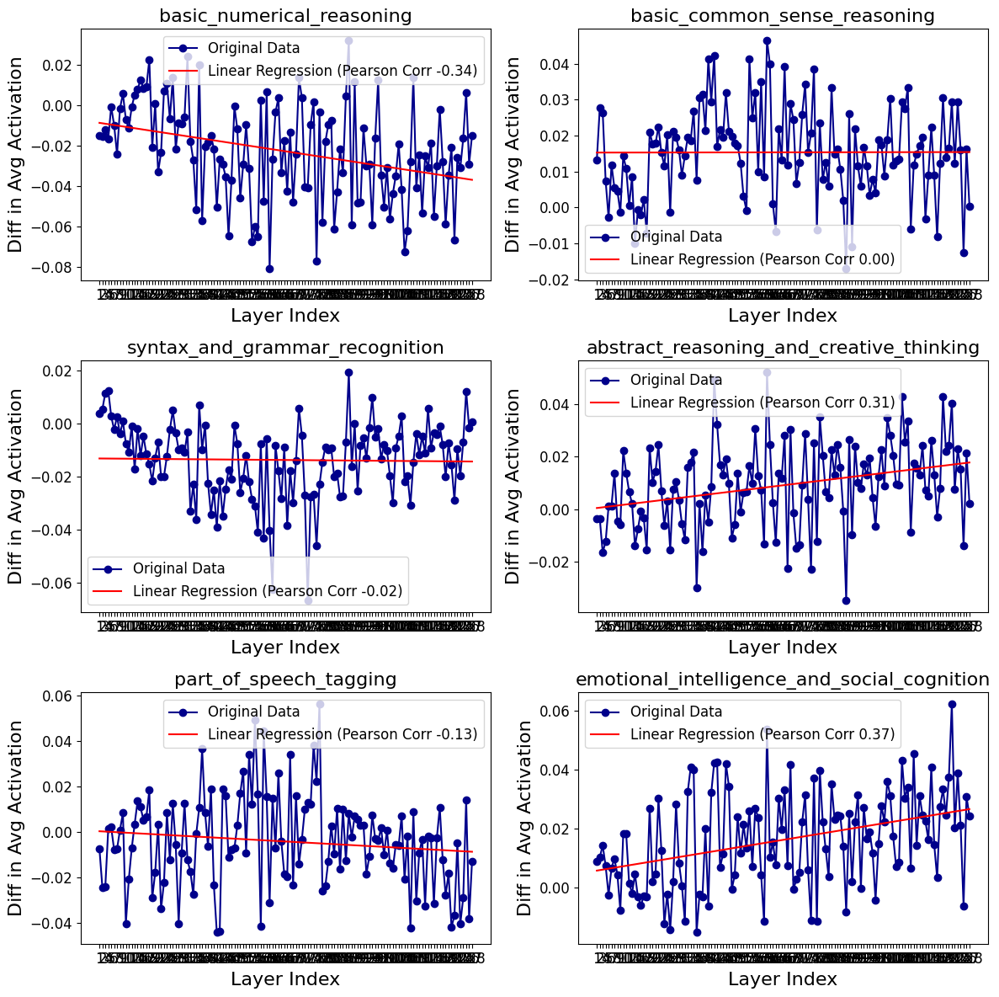

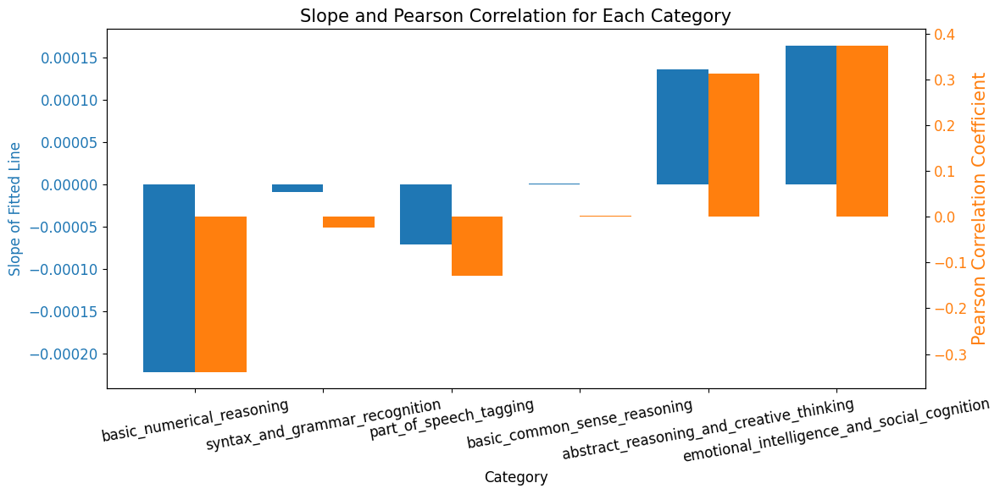

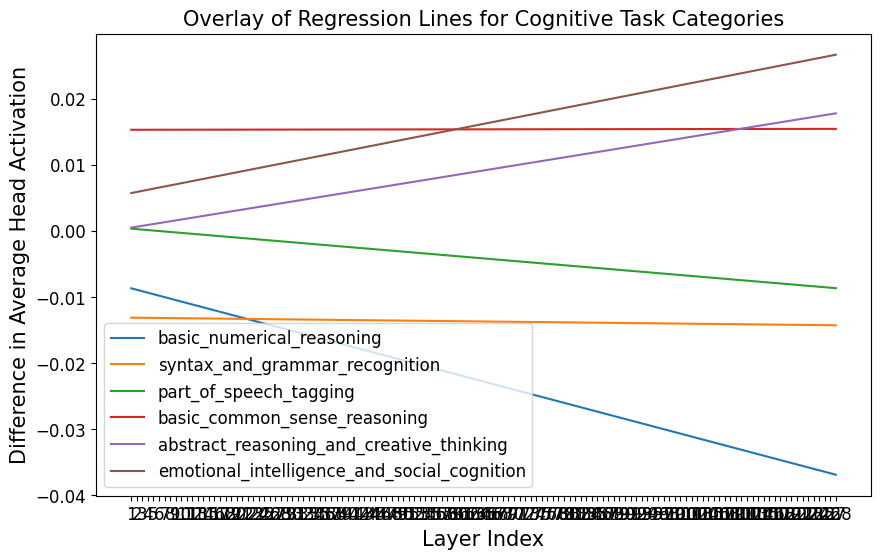

In [ ]:
results = plot_all_category_diffs_vs_syn_red_grad_rank(summary_stats_prompts, gradient_ranks[constants.ATTENTION_MEASURE], rest_category_prefix='rest', 
                                             save=False, reorder=False, mean_instead_of_rest=True, per_layer=True)

### Top Synergistic and Top Redundant Heads

In [ ]:
plot_most_syn_red_tasks(summary_stats_prompts, gradient_ranks[constants.ATTENTION_MEASURE], top_n=10)

IndexError: index 47 is out of bounds for axis 0 with size 32

### Average Rank of Most Significantly Activated Heads by Category

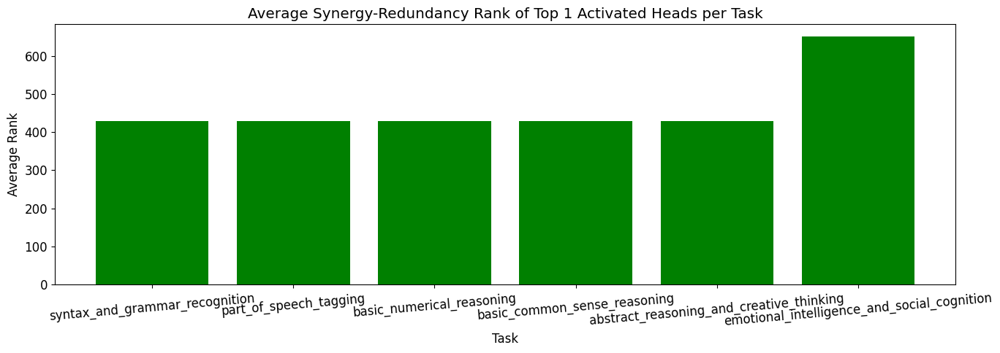

In [ ]:
plot_rank_most_activated_heads_per_task(summary_stats_prompts, gradient_ranks[constants.ATTENTION_MEASURE], top_n=1, save=True)

### Average Head Activation per Task

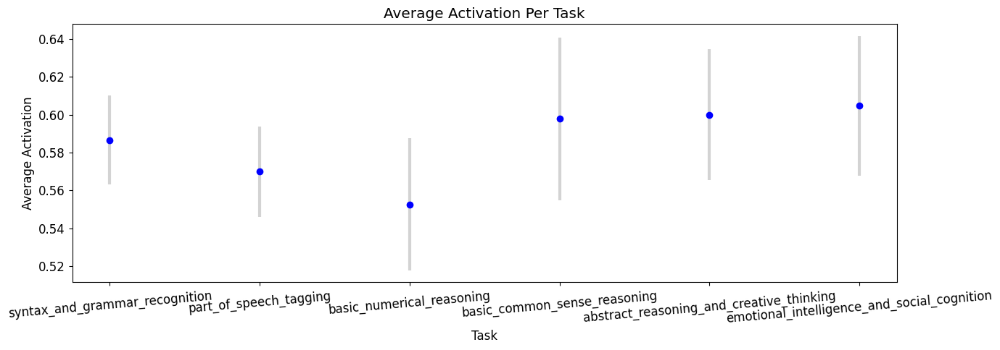

In [ ]:
plot_average_head_activation_per_task(summary_stats_prompts)